In [85]:
import fancyimpute 
import pandas as pd
import numpy as np
import missingno as msno # visualzing missing value
from fancyimpute import BiScaler, KNN, NuclearNormMinimization, SoftImpute
from ycimpute.imputer.mice import MICE
import time

# what is the best imputation method?
### Data loss mechanism varies in different scenarios, which requires the engineer to choose the appropriate filling method based on the context of data on hand.

# input of imputation is base_features
### do we need to do feature selection(no need to think about it)

In [86]:
df = pd.read_hdf('../features/base_featurs.h5','base_featurs')
no_need_to_inpute = ['SK_ID_CURR','index']
df.drop(no_need_to_inpute,axis = 1, inplace = True)
print (df.shape)

(356251, 218)


In [87]:
df.head()

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_REQ_CREDIT_BUREAU_QRT,APARTMENTS_MEDI,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,...,CC_AMT_TOTAL_RECEIVABLE_MEAN,CC_AMT_TOTAL_RECEIVABLE_SUM,CC_AMT_TOTAL_RECEIVABLE_VAR,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,CC_CNT_DRAWINGS_ATM_CURRENT_VAR,CC_CNT_DRAWINGS_CURRENT_MAX,CC_CNT_DRAWINGS_CURRENT_MEAN,CC_CNT_DRAWINGS_CURRENT_VAR,CC_CNT_DRAWINGS_POS_CURRENT_MAX,CC_NAME_CONTRACT_STATUS_Active_MIN
0,24700.5,406597.5,351000.0,0.0,0.0250,0,-9461,-637.0,-2120,-1134.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,35698.5,1293502.5,1129500.0,0.0,0.0968,1,-16765,-1188.0,-291,-828.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6750.0,135000.0,135000.0,0.0,NaN,0,-19046,-225.0,-2531,-815.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,29686.5,312682.5,297000.0,NaN,NaN,1,-19005,-3039.0,-2437,-617.0,...,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,NaN,1.0
4,21865.5,513000.0,513000.0,0.0,NaN,0,-19932,-3038.0,-3458,-1106.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


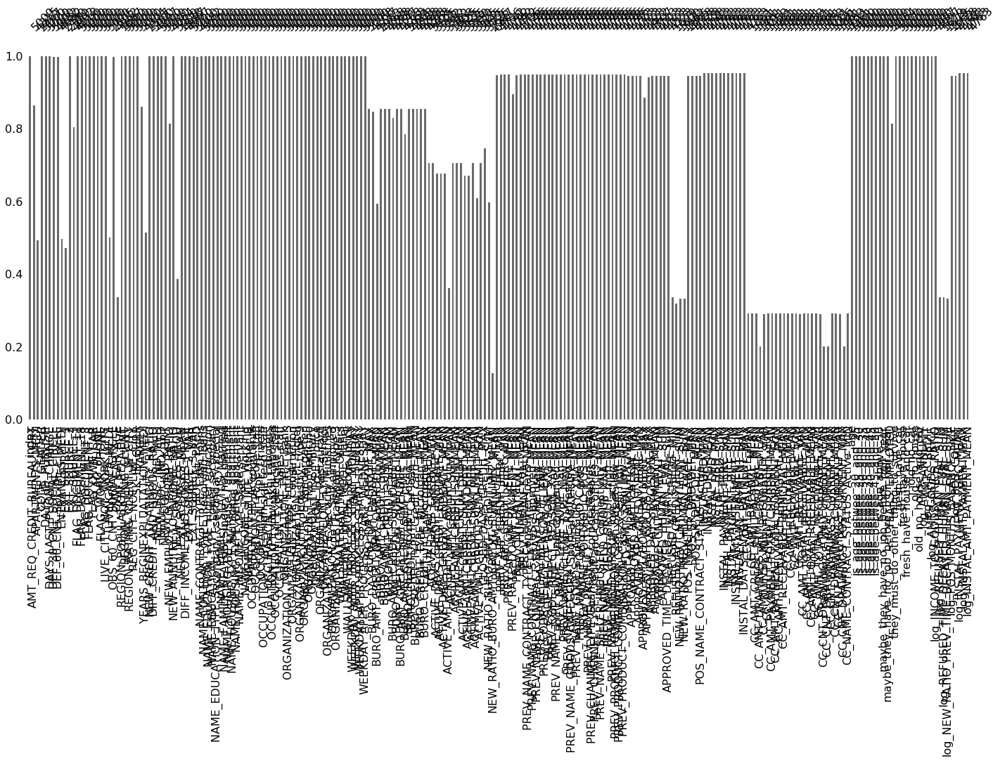

In [3]:
msno.bar(df.sample(5000))

# KNN inputation:

# In this tutorial we will use a non-parametric algorithm called k-nearest-neighbors (KNN) to replace missing values. This algorithm is applicable in any of the three previous situation, as long as there is a relationship between the variable with the missing value and the other variables.

# The assumption behind using KNN for missing values is that a point value can be approximated by the values of the points that are closest to it, based on other variables.


# each point in a vector space is a training example

# Reference: https://towardsdatascience.com/the-use-of-knn-for-missing-values-cf33d935c637(they provided library but I didnot use this one)
# Library: https://github.com/YunnanShuke/ycimpute/blob/master/doc_eng.md

# Step1: split dataframe into multiple dataframe to avoid memory problem

In [92]:
small_df_ls = []
# shuffle
df = df.sample(frac = 1.0)
print (df.shape)
num_split = 25
previous_step = None
for i, step in enumerate(np.arange(0, df.shape[0], step = int(df.shape[0] / num_split))):
    # for memory problem, we cannot feed all the data points into algorithm, which depends on row and n_features
    if i == 0:
        pass
    elif i == 1:
        small_df_ls.append(df[0: step])
        previous_step = step
    elif i == (num_split):
        small_df_ls.append(df[previous_step: ])
        break
    else:
        small_df_ls.append(df[previous_step: step])
        previous_step = step
# unit testing
print ('no mistake on splitting based on shape' if pd.concat(small_df_ls, axis = 0).shape[0] == len(df)
       else 'oops, sth wrong in splitting')
print ('no mistakg on splltting based on length' if len(small_df_ls) == num_split 
       else "oops, sth wrong in splitting")


(356251, 218)
no mistake on splitting based on shape
no mistakg on splltting based on length


# Step2: imputatiing based on imputation method u chossed

num_traning_point 14250
Imputing row 1/5 with 29 missing, elapsed time: 0.000
[KNN] Warning: 5/1090 still missing after imputation, replacing with 0
num_traning_point 14250


/home/linuxbrew/.linuxbrew/opt/python/lib/python3.6/site-packages/knnimpute/normalized_distance.py:62: RuntimeWarning: invalid value encountered in subtract
  np.subtract(X, x.reshape((1, n_cols)), out=diffs)


Imputing row 1/5 with 29 missing, elapsed time: 0.001
[KNN] Warning: 25/1090 still missing after imputation, replacing with 0
num_traning_point 14250
Imputing row 1/5 with 48 missing, elapsed time: 0.000
[KNN] Warning: 6/1090 still missing after imputation, replacing with 0
num_traning_point 14250
Imputing row 1/5 with 8 missing, elapsed time: 0.000
[KNN] Warning: 99/1090 still missing after imputation, replacing with 0
num_traning_point 14250
Imputing row 1/5 with 42 missing, elapsed time: 0.000
[KNN] Warning: 5/1090 still missing after imputation, replacing with 0
num_traning_point 14250
Imputing row 1/5 with 31 missing, elapsed time: 0.000
[KNN] Warning: 17/1090 still missing after imputation, replacing with 0
num_traning_point 14250
Imputing row 1/5 with 15 missing, elapsed time: 0.000
[KNN] Warning: 5/1090 still missing after imputation, replacing with 0
num_traning_point 14250
Imputing row 1/5 with 75 missing, elapsed time: 0.000
[KNN] Warning: 137/1090 still missing after imputa

/home/linuxbrew/.linuxbrew/opt/python/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Imputing row 1/5 with 8 missing, elapsed time: 0.000
[KNN] Warning: 40/1090 still missing after imputation, replacing with 0
num_traning_point 14250
Imputing row 1/5 with 43 missing, elapsed time: 0.000
num_traning_point 14250
Imputing row 1/5 with 40 missing, elapsed time: 0.000
[KNN] Warning: 5/1090 still missing after imputation, replacing with 0
num_traning_point 14250
Imputing row 1/5 with 16 missing, elapsed time: 0.000
[KNN] Warning: 5/1090 still missing after imputation, replacing with 0
num_traning_point 14251
Imputing row 1/5 with 49 missing, elapsed time: 0.000
[KNN] Warning: 35/1090 still missing after imputation, replacing with 0
14.542261600494385


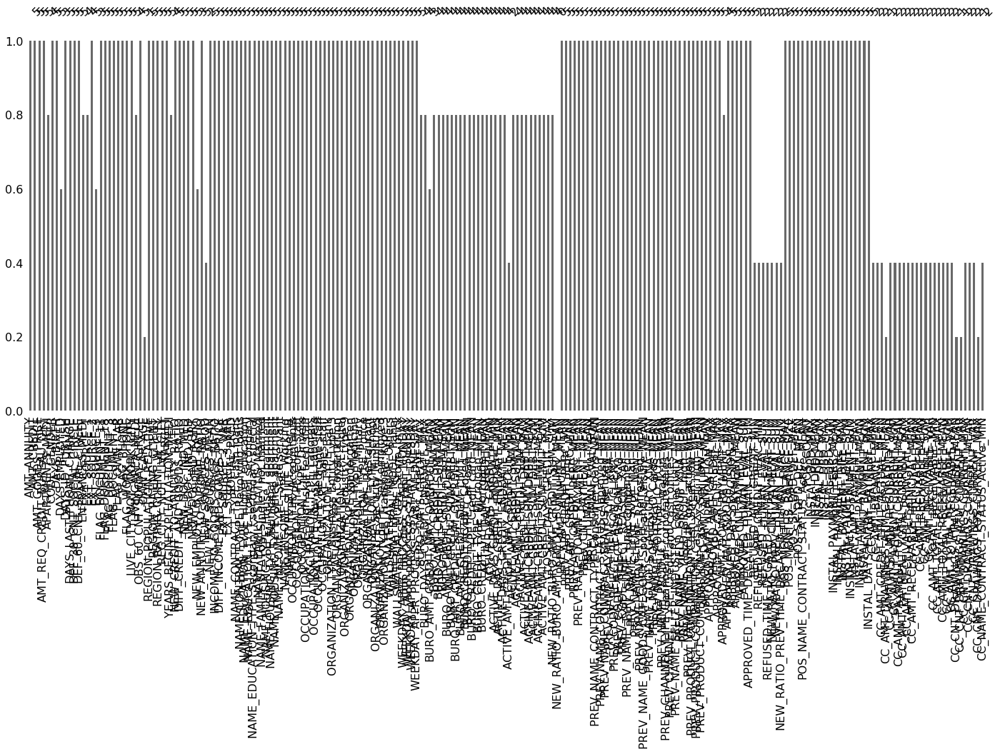

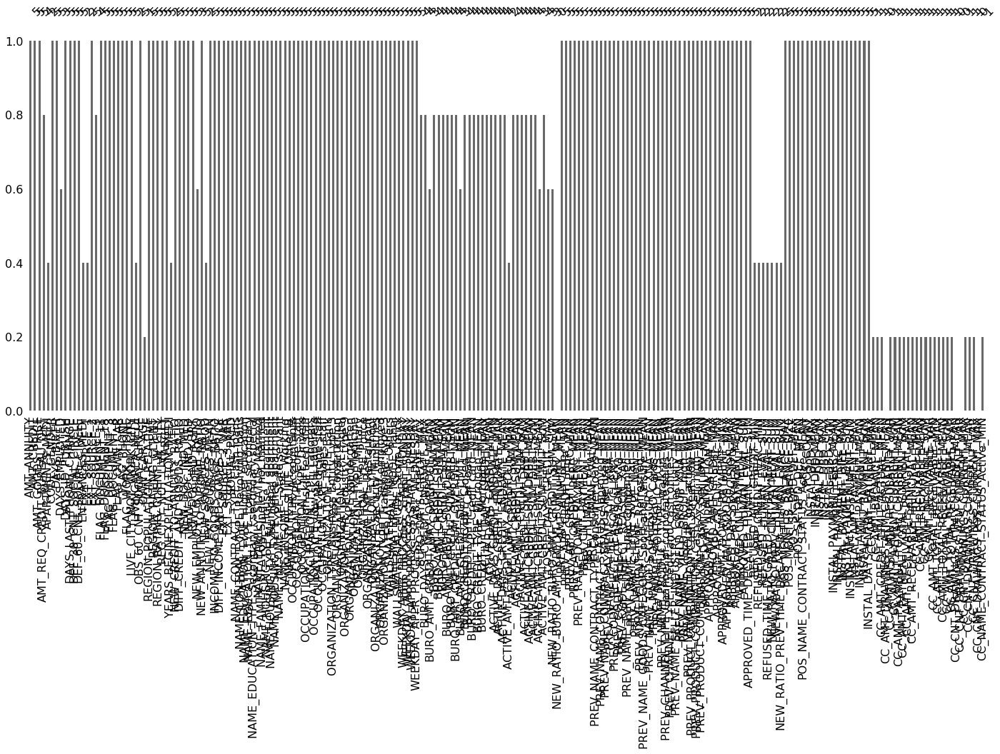

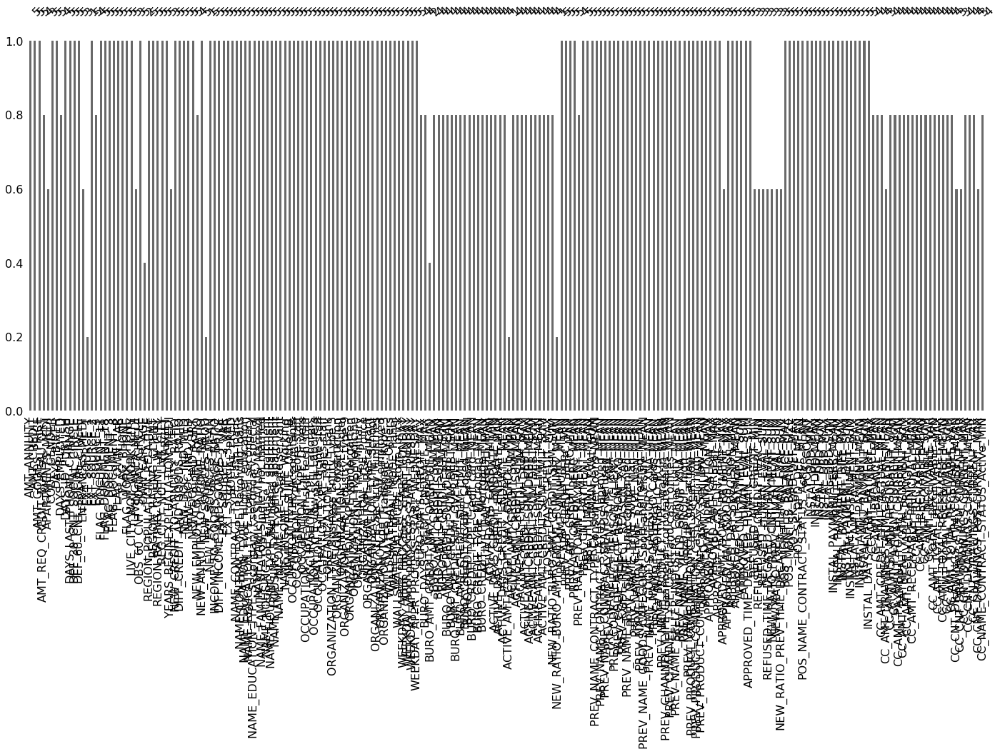

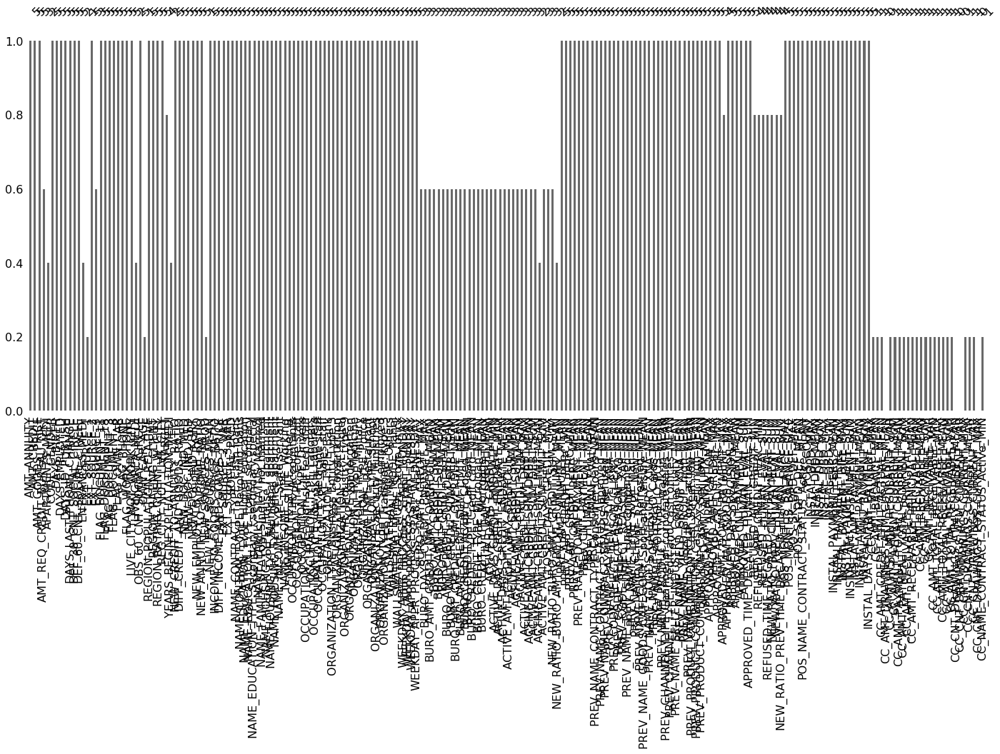

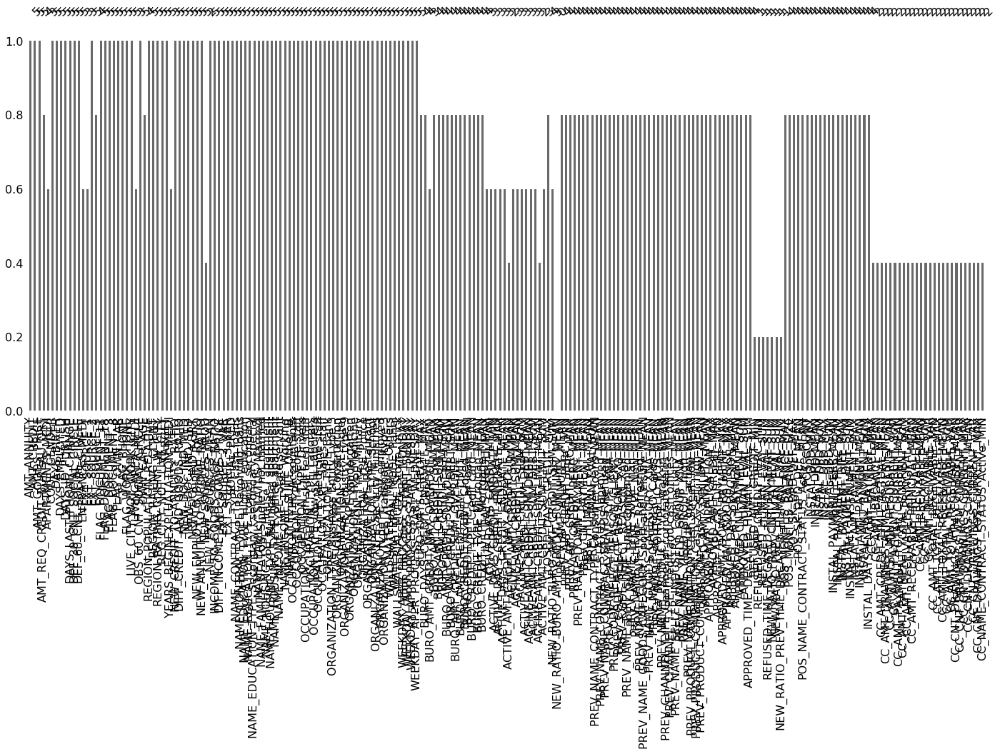

...

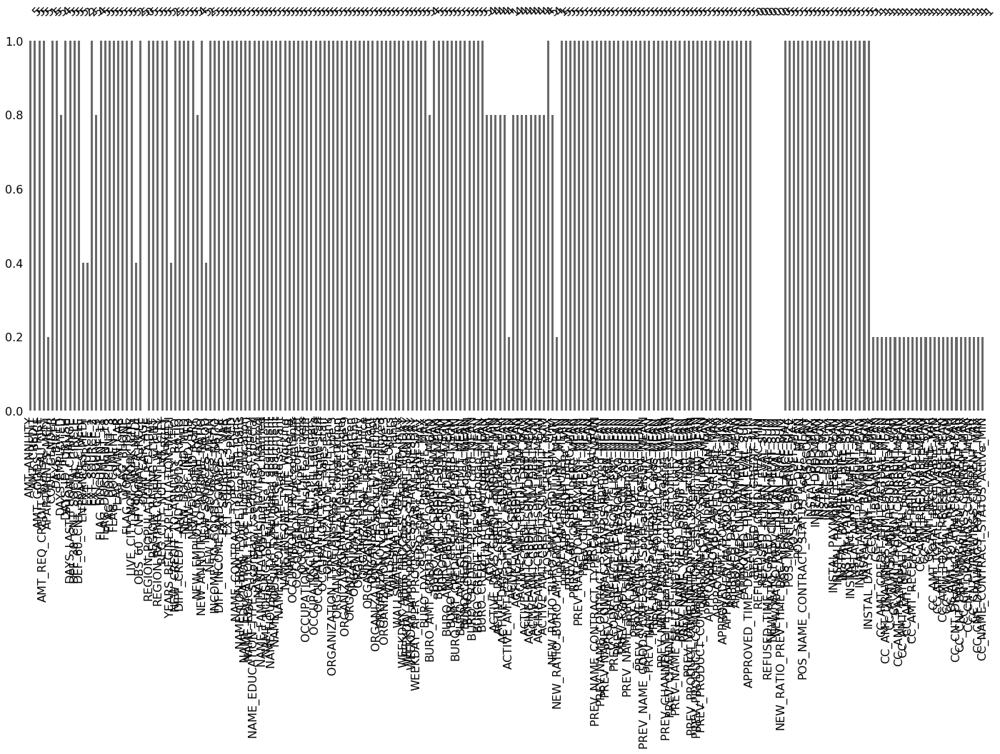

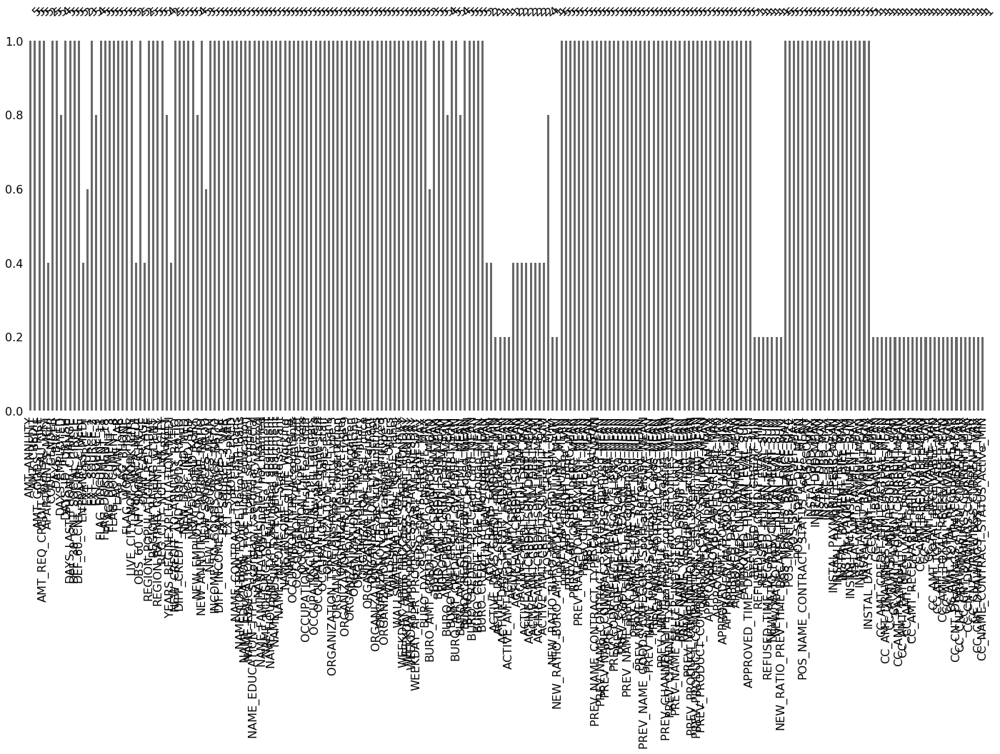

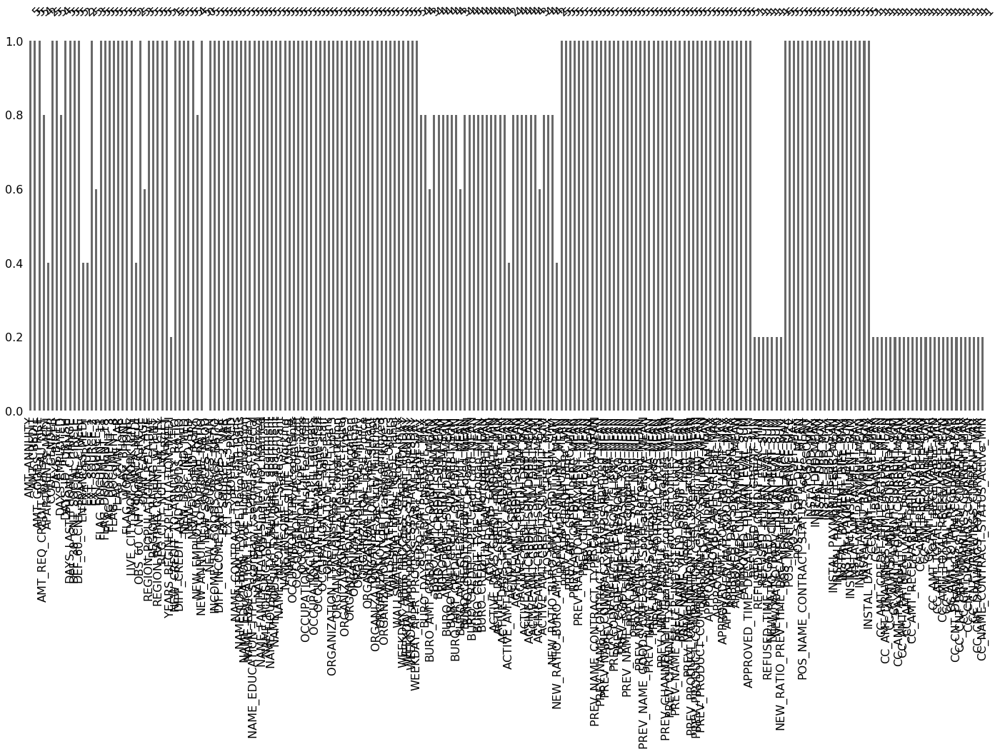

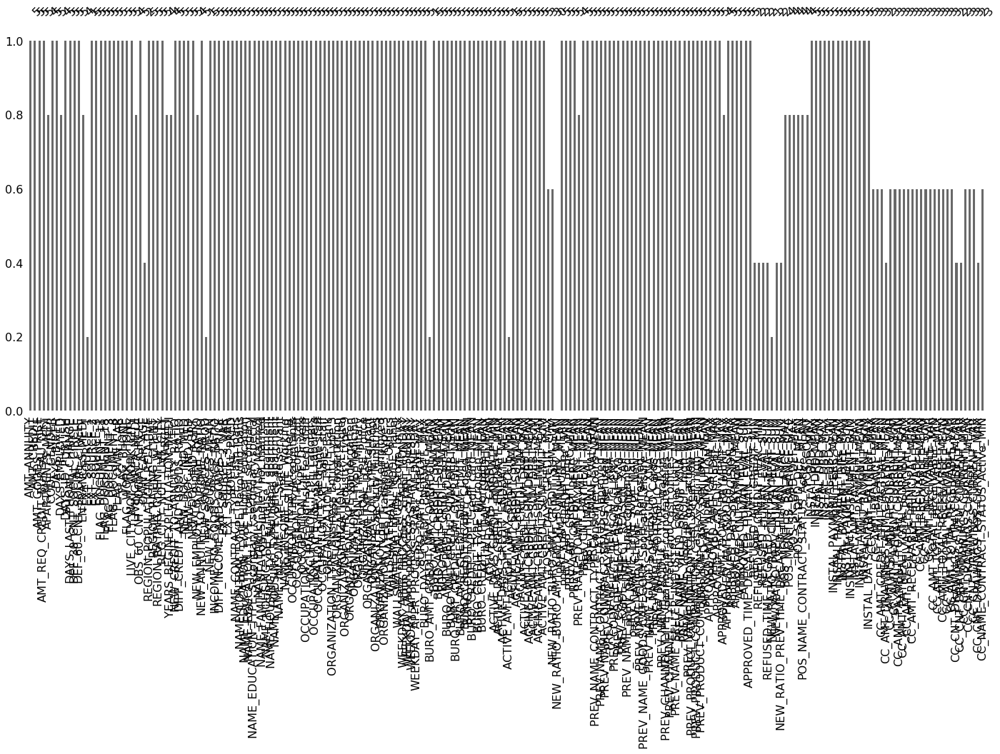

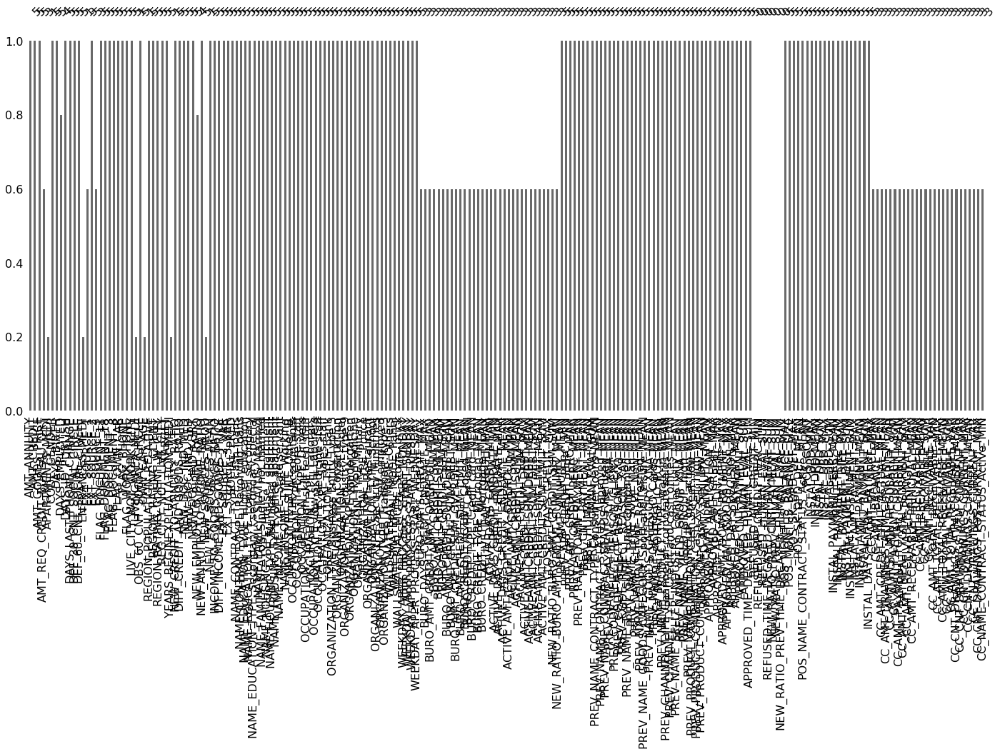

In [94]:
# core
s = time.time() 
drop_targtet = False
small_df_filled_ls = []
k = 5 # by default
for small_df in small_df_ls:
    # setting
    print ('num_traning_point', len(small_df))
    # preprocessing for algorithm
    if drop_targtet == True:
        # avoidnig using TARGET to impute
        small_df.drop(['TARGET'], axis =1, inplace = True)
        X_missing = small_df.head(n = 5).copy()
    else:
        X_missing = small_df.head(n = 5).copy()
    # core algorithm: input should be array
    X_filled = KNN(k = k).complete(X_missing.values)
    small_df_filled_ls.append(pd.DataFrame(X_filled, columns = X_missing.columns))
e = time.time()
print (e-s) # 790 secs =~ 10 mins

In [96]:
[len(i) for i in small_df_filled_ls], len(small_df_filled_ls)

([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5],
 25)

In [101]:
# output
df_filled = pd.concat(small_df_filled_ls, axis = 0)
print (df_filled.shape)

(125, 218)


In [ ]:
df.shape[0] / 17812 * 790/ 60/60 
# 約花4.3小時去填充完整個features

/home/linuxbrew/.linuxbrew/opt/python/lib/python3.6/site-packages/ycimpute/unsupervised/knn/normalized_distance.py:52: RuntimeWarning: invalid value encountered in subtract
  np.subtract(X, x.reshape((1, n_cols)), out=diffs)


Imputing row 1/17812 with 37 missing, elapsed time: 705.583
Imputing row 101/17812 with 55 missing, elapsed time: 706.101
Imputing row 201/17812 with 38 missing, elapsed time: 706.585
Imputing row 301/17812 with 30 missing, elapsed time: 707.005
Imputing row 401/17812 with 75 missing, elapsed time: 707.465
Imputing row 501/17812 with 40 missing, elapsed time: 707.909
Imputing row 601/17812 with 39 missing, elapsed time: 708.428
Imputing row 701/17812 with 45 missing, elapsed time: 708.942
Imputing row 801/17812 with 29 missing, elapsed time: 709.420
Imputing row 901/17812 with 37 missing, elapsed time: 709.861
Imputing row 1001/17812 with 41 missing, elapsed time: 710.322
Imputing row 1101/17812 with 42 missing, elapsed time: 710.749
Imputing row 1201/17812 with 73 missing, elapsed time: 711.228
Imputing row 1301/17812 with 15 missing, elapsed time: 711.696
Imputing row 1401/17812 with 6 missing, elapsed time: 712.197
Imputing row 1501/17812 with 39 missing, elapsed time: 712.711
Imput

Imputing row 13001/17812 with 37 missing, elapsed time: 767.116
Imputing row 13101/17812 with 89 missing, elapsed time: 767.614
Imputing row 13201/17812 with 38 missing, elapsed time: 768.063
Imputing row 13301/17812 with 40 missing, elapsed time: 768.535
Imputing row 13401/17812 with 104 missing, elapsed time: 768.991
Imputing row 13501/17812 with 39 missing, elapsed time: 769.410
Imputing row 13601/17812 with 30 missing, elapsed time: 769.862
Imputing row 13701/17812 with 63 missing, elapsed time: 770.329
Imputing row 13801/17812 with 38 missing, elapsed time: 770.738
Imputing row 13901/17812 with 59 missing, elapsed time: 771.192
Imputing row 14001/17812 with 43 missing, elapsed time: 771.687
Imputing row 14101/17812 with 33 missing, elapsed time: 772.221
Imputing row 14201/17812 with 11 missing, elapsed time: 772.692
Imputing row 14301/17812 with 46 missing, elapsed time: 773.154
Imputing row 14401/17812 with 54 missing, elapsed time: 773.594
Imputing row 14501/17812 with 39 missin

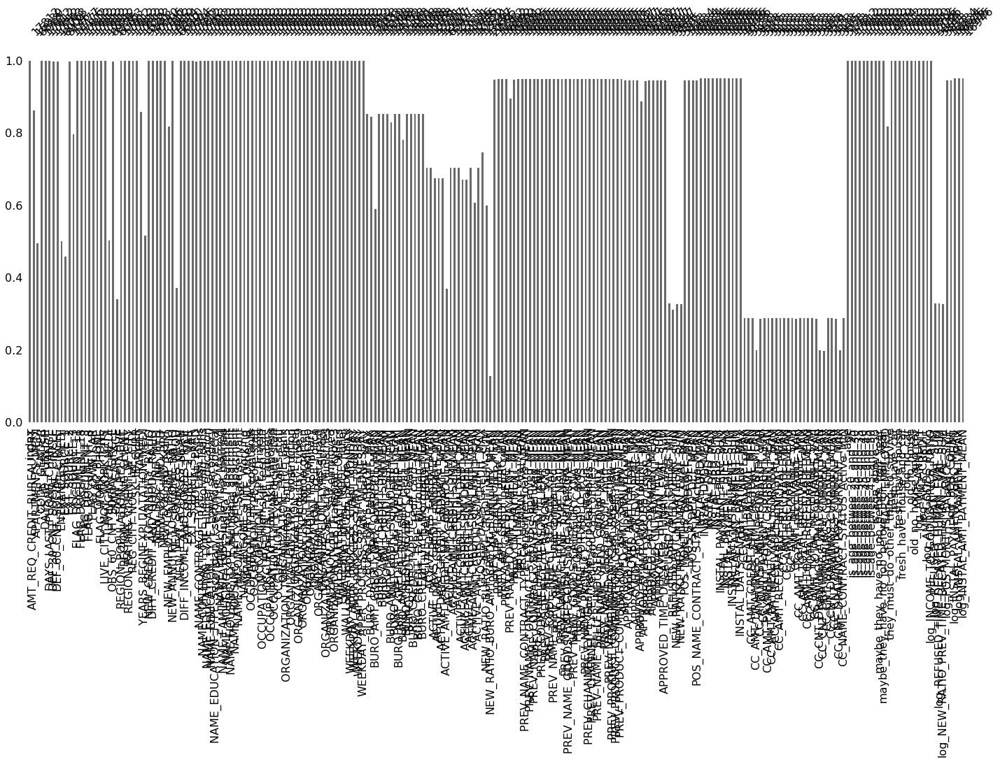

In [8]:
from ycimpute.imputer.knnimput import KNN
s = time.time()
# setting
num_traning_point = int(df.shape[0] * 0.05) # for memory problem, we cannot feed all the data points into algorithm, which depends on row and n_features
print ('num_traning_point', num_traning_point)
# no distance can tune
# preprocessing for algorithm
drop_targtet = False
if drop_targtet == True:
    # avoidnig using TARGET to impute
    df.drop(['TARGET'], axis =1, inplace = True)
    X_missing = df.sample(n = num_traning_point).copy()
else:
    X_missing = df.sample(n = num_traning_point).copy()
# 
msno.bar(X_missing)
# core algorithm: input should be array
X_filled = KNN(k = 3).complete(X_missing.values)
e = time.time()
print (e-s) # 790 secs =~ 10 mins

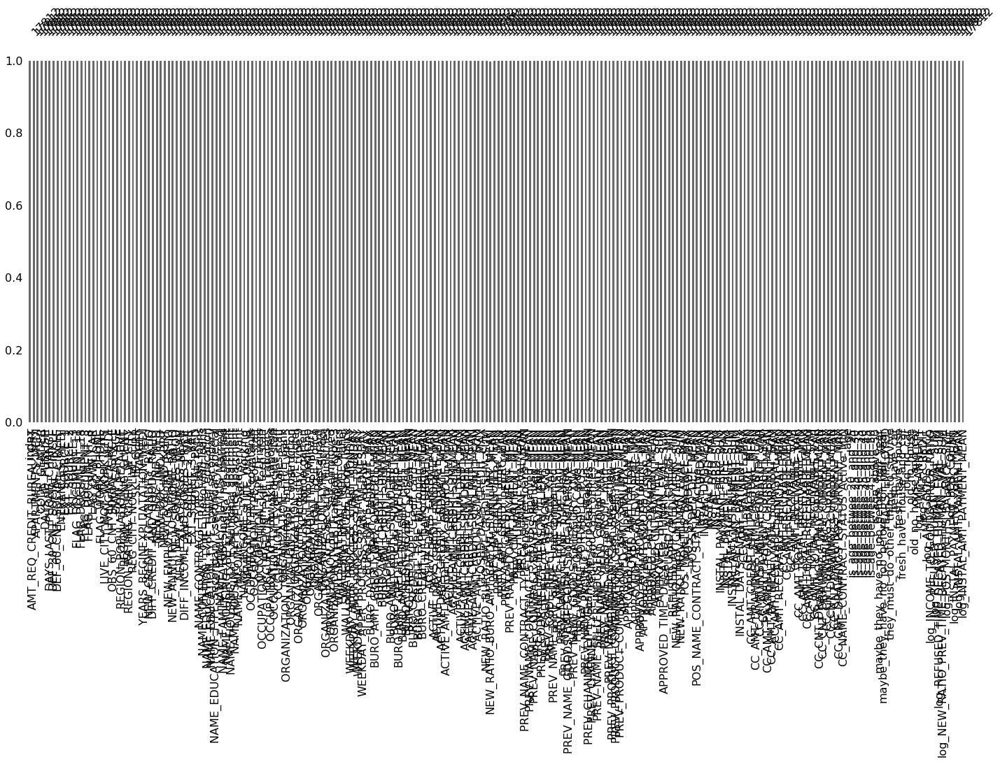

In [15]:
# input of msno is DataFrame
X_filled = pd.DataFrame(X_filled, columns = X_missing.columns)
msno.bar(X_filled)

# Nearest neighbor imputations which weights samples using the mean squared difference on features for which two rows both have observed data.

### The assumption behind using KNN for missing values is that a point value can be approximated by the values of the points that are closest to it, based on other variables.

In [ ]:
# X is the complete data matrix

# X_incomplete has the same values as X except a subset have been replace with NaN

# Use 3 nearest rows which have a feature to fill in each row's missing features
X_filled_knn = KNN(k = 1).complete(X_incomplete)





In [ ]:
pd.DataFrame(X_filled_knn, columns = X_incomplete.columns)

In [ ]:
X_incomplete = df[['APARTMENTS_MEDI']].head(10)
X_incomplete

In [ ]:
X_filled_knn = KNN(k = 1).complete(X_incomplete)


In [ ]:
pd.DataFrame(X_filled_knn, columns = X_incomplete.columns)

In [ ]:
msno.bar(pd.DataFrame(X_filled_knn))

In [ ]:
# matrix completion using convex optimization to find low-rank solution
# that still matches observed values. Slow!
s = time.time()
X_incomplete = df.copy()
X_filled_nnm = NuclearNormMinimization().complete(X_incomplete)
e = time.time()
print (e-s)

In [ ]:
# Instead of solving the nuclear norm objective directly, instead
# induce sparsity using singular value thresholding
import time
s = time.time()
X_incomplete = df.copy()
X_filled_softimpute = SoftImpute().complete(X_incomplete)


In [ ]:
# print mean squared error for the three imputation methods above
nnm_mse = ((X_filled_nnm[missing_mask] - X[missing_mask]) ** 2).mean()
print("Nuclear norm minimization MSE: %f" % nnm_mse)

softImpute_mse = ((X_filled_softimpute[missing_mask] - X[missing_mask]) ** 2).mean()
print("SoftImpute MSE: %f" % softImpute_mse)

knn_mse = ((X_filled_knn[missing_mask] - X[missing_mask]) ** 2).mean()
print("knnImpute MSE: %f" % knn_mse)